In [91]:
#Loading Libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from google.colab.patches import cv2_imshow
from skimage.feature import blob_log, blob_dog, hog
from skimage import color, exposure
from skimage.restoration import denoise_tv_chambolle

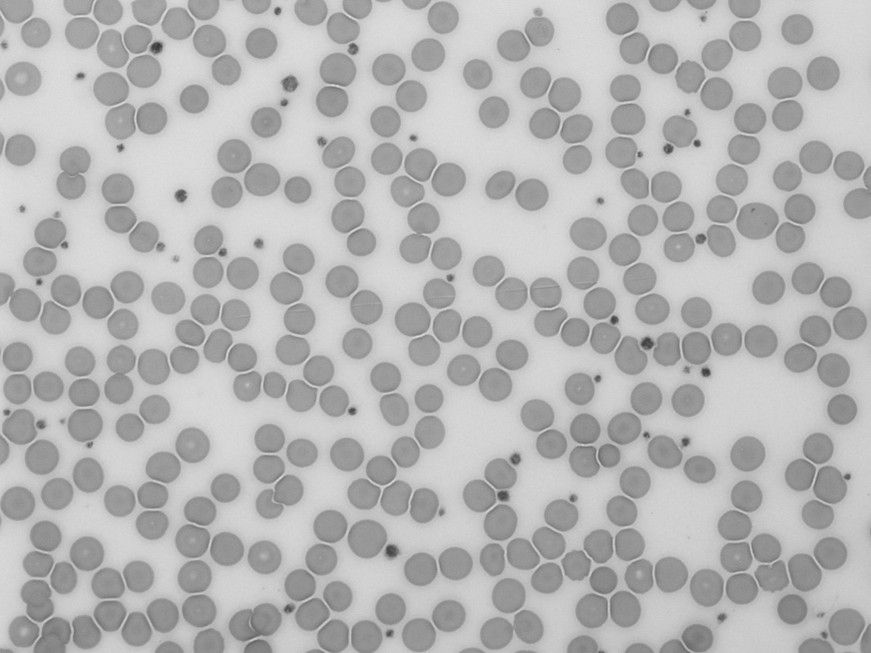

In [3]:
#Loading Image
image_path = "/content/rbc1.jpg"
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
cv2_imshow(img)

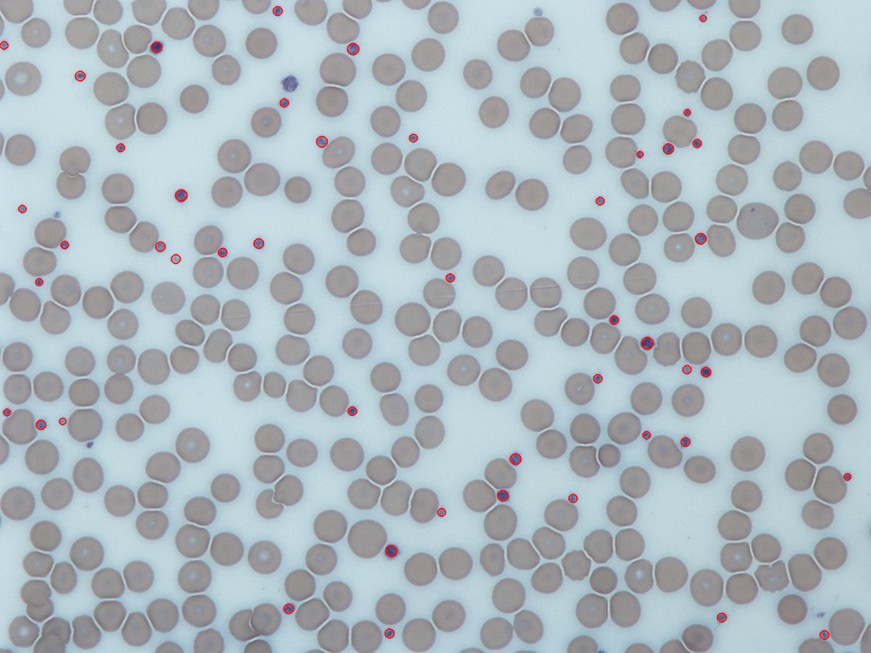

In [4]:
#Checking For blobs
params = cv2.SimpleBlobDetector_Params()
params.filterByArea = True

params.minArea = 10
params.maxArea = 100

params.filterByCircularity = True
params.minCircularity = 0.5
params.filterByConvexity = True
params.minConvexity = 0.8

params.filterByInertia = True
params.minInertiaRatio = 0.6

params.filterByColor = True
params.blobColor = 0

detector = cv2.SimpleBlobDetector_create(params)
keypoints = detector.detect(img)

img_color = cv2.imread(image_path)
img_with_blobs = cv2.drawKeypoints(img_color, keypoints, np.array([]), (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

cv2_imshow(img_with_blobs)

LoG Blob Detection


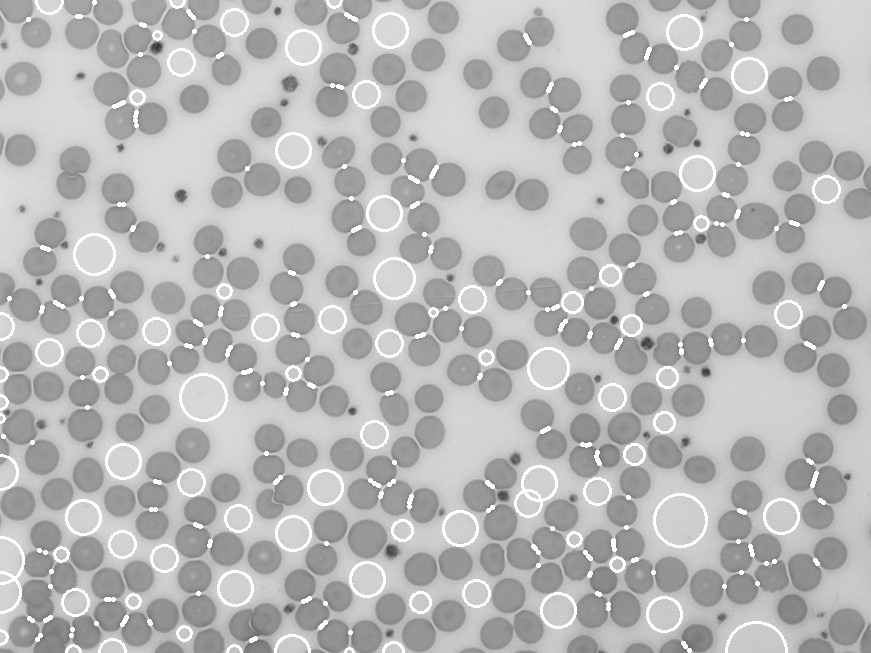

In [7]:
#Detecting Log blobs
log_blobs = blob_log(img, max_sigma=30, num_sigma=10, threshold=.1)

im_log = img.copy()

for blob in log_blobs:
    y, x, r = blob
    cv2.circle(im_log, (int(x), int(y)), int(r), (255, 0, 0), 2)

print("LoG Blob Detection")
cv2_imshow(im_log)

DoG Blob Detection


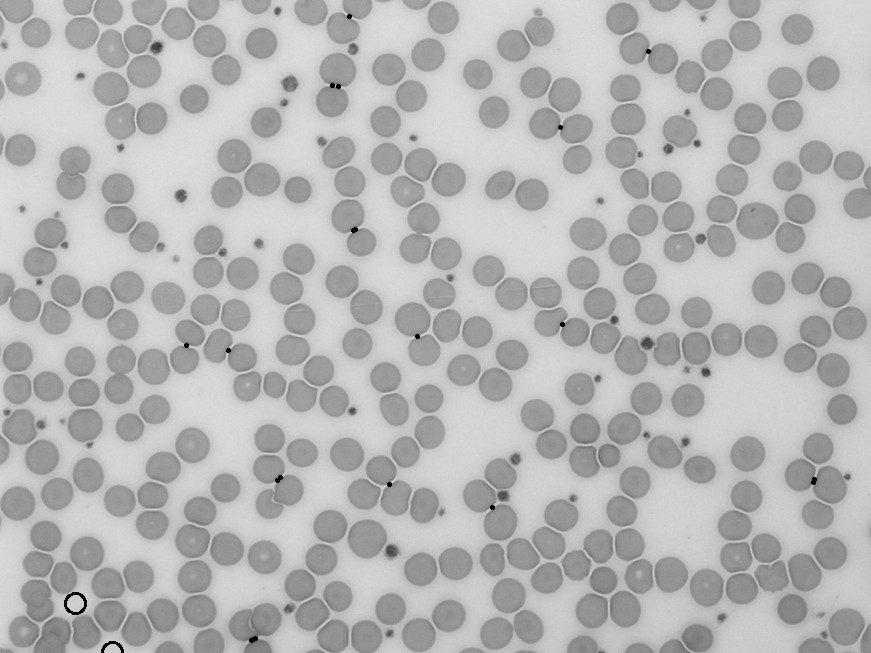

In [8]:
#Detecting Dog blobs
dog_blobs = blob_dog(img, max_sigma=30, threshold=.1)

im_dog = img.copy()

for blob in dog_blobs:
    y, x, r = blob
    cv2.circle(im_dog, (int(x), int(y)), int(r), (0, 255, 0), 2)

print("DoG Blob Detection")
cv2_imshow(im_dog)

Edge Detection)


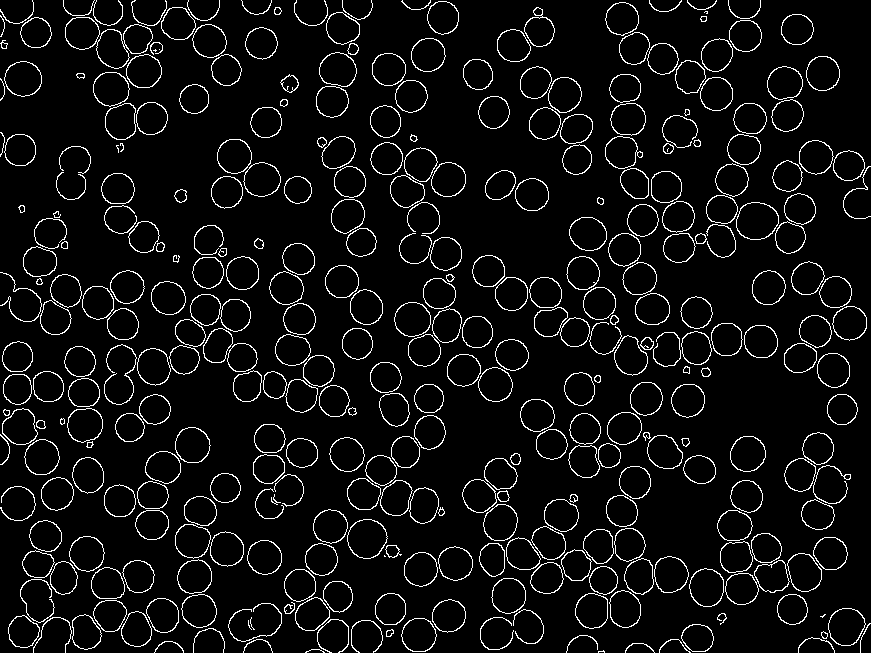

In [10]:
edges = cv2.Canny(img, 100, 200)

print("Edge Detection)")
cv2_imshow(edges)

LoG Blob Detection (Purple)


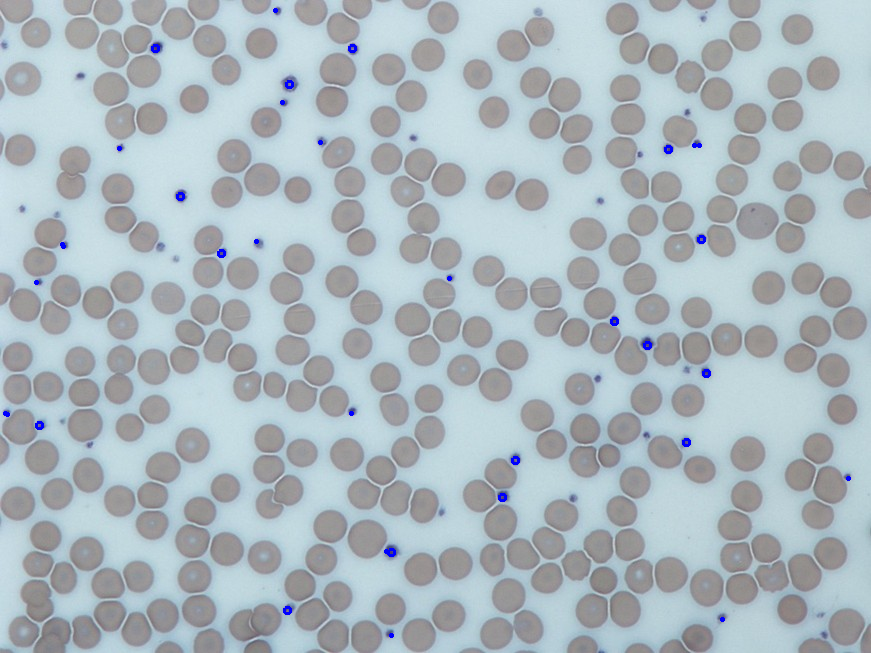

In [12]:
#Hog Presentation
# Convert the image to BGR before converting to HSV
img_color = cv2.imread(image_path, cv2.IMREAD_COLOR)  # Read in color
hsv = cv2.cvtColor(img_color, cv2.COLOR_BGR2HSV)

lower_purple = np.array([120, 50, 50])
upper_purple = np.array([150, 255, 255])

mask = cv2.inRange(hsv, lower_purple, upper_purple)
filtered_img = cv2.bitwise_and(img_color, img_color, mask=mask) # Use img_color here
gray_filtered = cv2.cvtColor(filtered_img, cv2.COLOR_BGR2GRAY)

log_blobs = blob_log(gray_filtered, max_sigma=20, num_sigma=10, threshold=.1)

im_log = img_color.copy() # Use img_color here
for blob in log_blobs:
    y, x, r = blob
    cv2.circle(im_log, (int(x), int(y)), int(r), (255, 0, 0), 2)

print("LoG Blob Detection (Purple)")
cv2_imshow(im_log)

DoG Blob Detection (Purple)


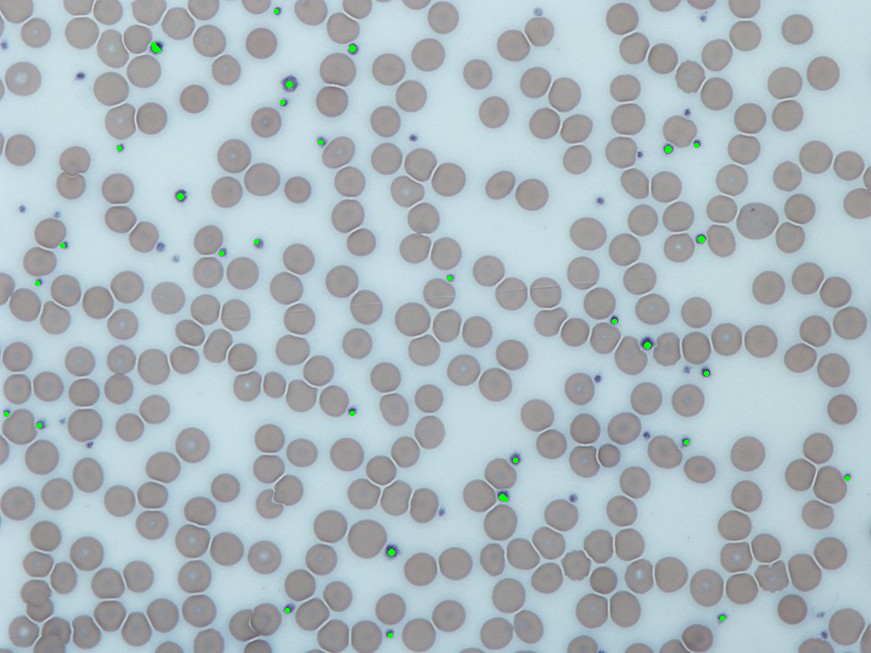

In [17]:
dog_blobs = blob_dog(gray_filtered, max_sigma=20, threshold=.1)

im_dog = img_color.copy()
for blob in dog_blobs:
    y, x, r = blob
    cv2.circle(im_dog, (int(x), int(y)), int(r), (0, 255, 0), 2)

print("DoG Blob Detection (Purple)")
cv2_imshow(im_dog)

Edge Detection (for HoG - Purple Emphasis)


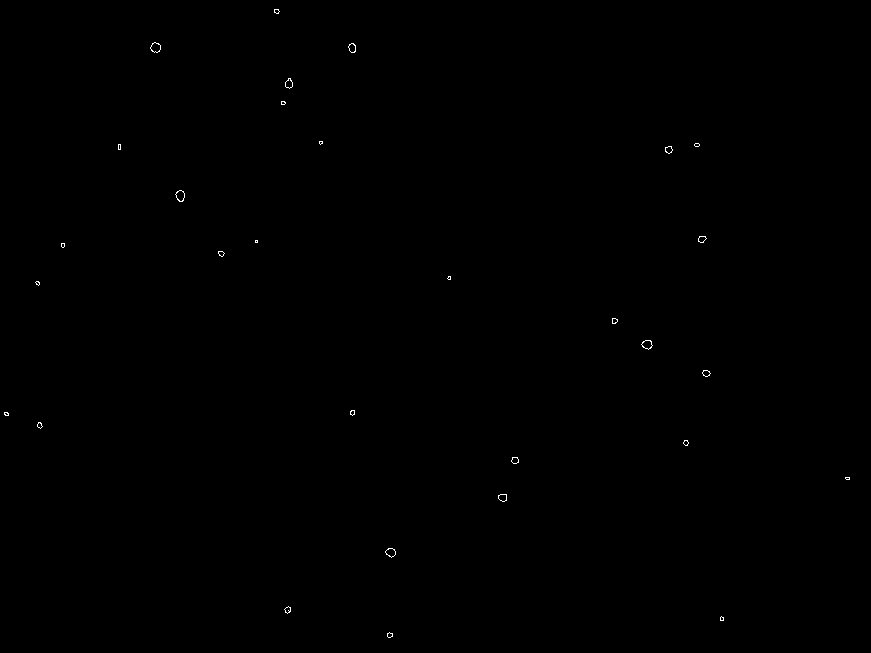

In [16]:
edges = cv2.Canny(gray_filtered, 100, 200)

print("Edge Detection (for HoG - Purple Emphasis)")
cv2_imshow(edges)

LOG


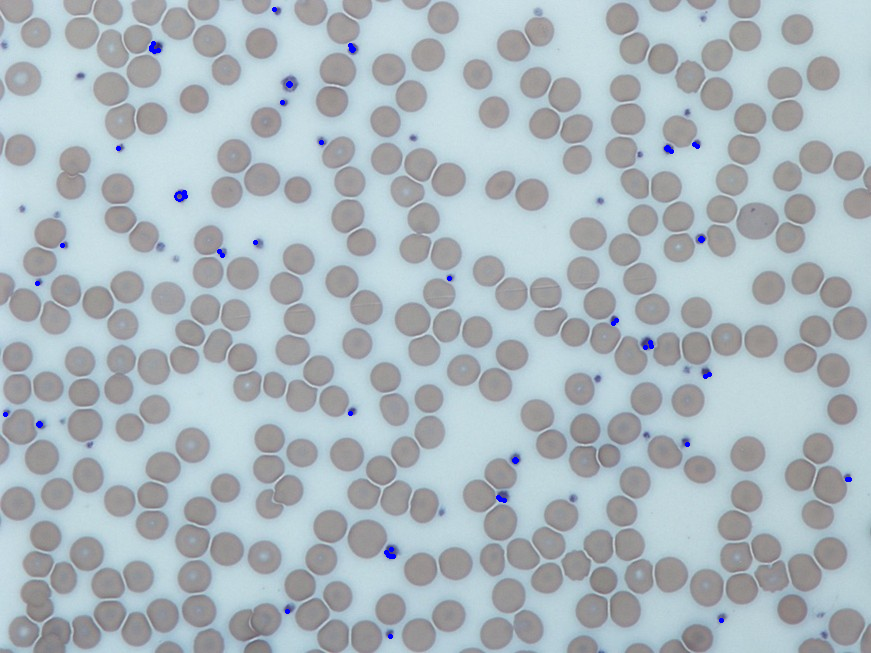

In [21]:
img_blur = cv2.medianBlur(img_color, 3)

hsv = cv2.cvtColor(img_blur, cv2.COLOR_BGR2HSV)

lower_purple = np.array([120, 40, 40])
upper_purple = np.array([160, 255, 255])

mask = cv2.inRange(hsv, lower_purple, upper_purple)

filtered_img = cv2.bitwise_and(img_blur, img_blur, mask=mask)
gray_filtered = cv2.cvtColor(filtered_img, cv2.COLOR_BGR2GRAY)
gray_equalized = cv2.equalizeHist(gray_filtered)

print("LOG")
log_blobs = blob_log(gray_equalized, max_sigma=15, num_sigma=10, threshold=.08)
im_log = img_color.copy()
for blob in log_blobs:
    y, x, r = blob
    cv2.circle(im_log, (int(x), int(y)), int(r), (255, 0, 0), 2)
cv2_imshow(im_log)

DOG


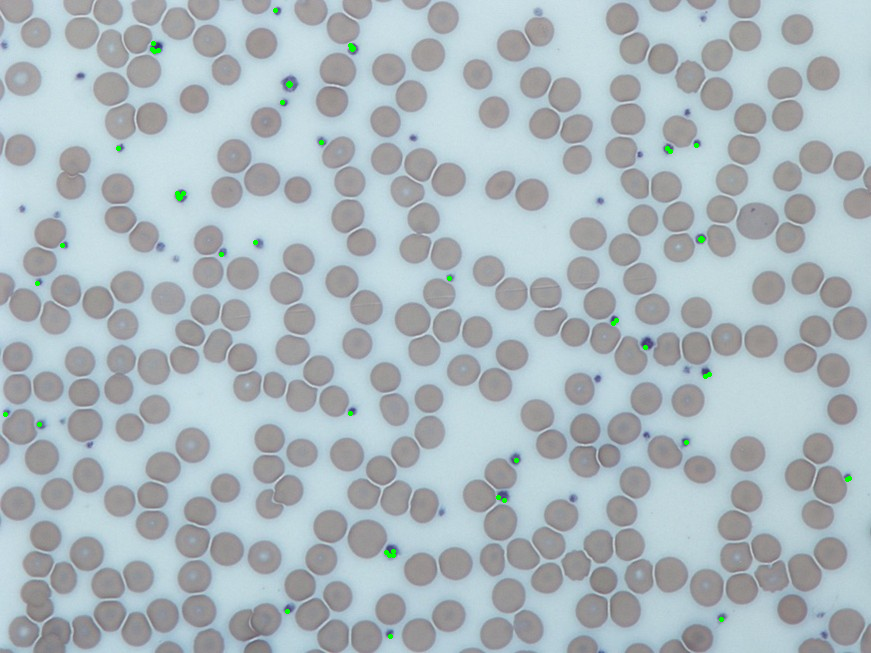

In [23]:
print("DOG")
dog_blobs = blob_dog(gray_equalized, max_sigma=15, threshold=.08)
im_dog = img_color.copy()
for blob in dog_blobs:
    y, x, r = blob
    cv2.circle(im_dog, (int(x), int(y)), int(r), (0, 255, 0), 2)
cv2_imshow(im_dog)

HOG


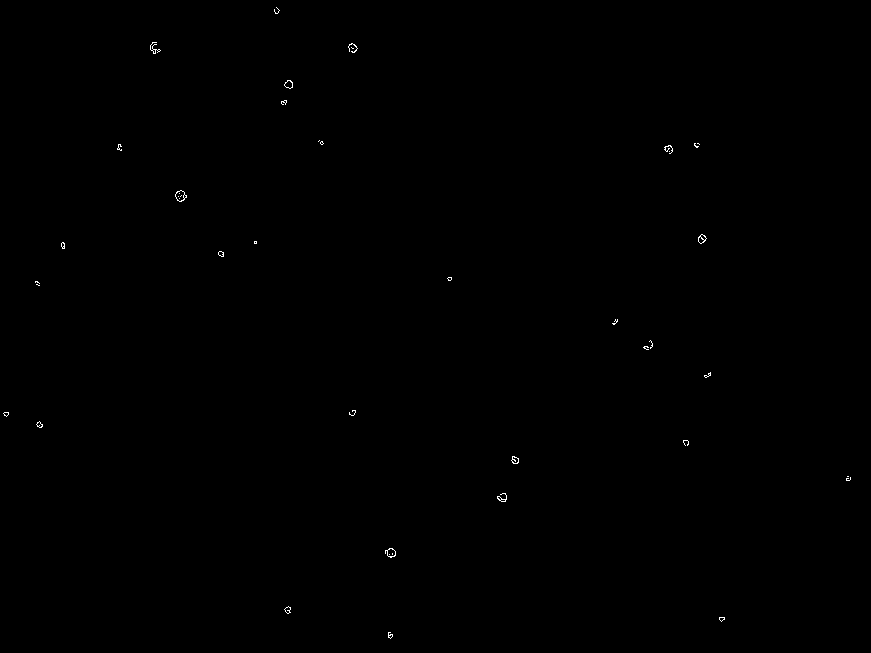

In [24]:
print("HOG")
edges = cv2.Canny(gray_equalized, 150, 250)
cv2_imshow(edges)

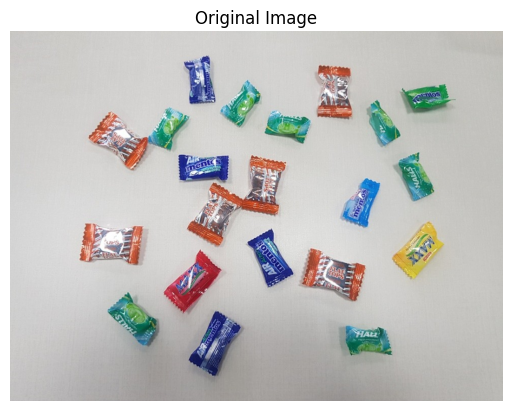

In [33]:
image_path = "/content/toffee.jpg"
toffee_img = cv2.imread(image_path)

plt.imshow(cv2.cvtColor(toffee_img, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")
plt.show()

In [ ]:




edges = cv2.Canny(morph, 50, 150)
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)



(np.float64(-0.5), np.float64(974.5), np.float64(731.5), np.float64(-0.5))

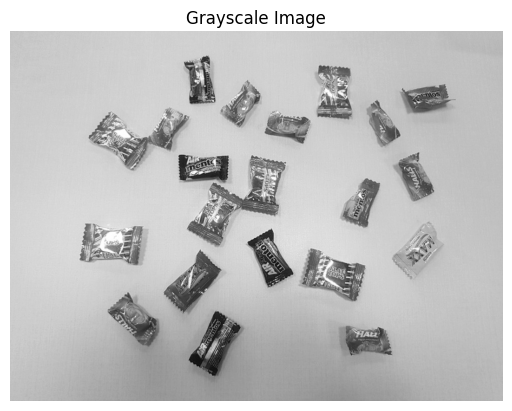

In [35]:
gray = cv2.cvtColor(toffee_img, cv2.COLOR_BGR2GRAY)

plt.imshow(gray, cmap="gray")
plt.title("Grayscale Image")
plt.axis("off")

(np.float64(-0.5), np.float64(974.5), np.float64(731.5), np.float64(-0.5))

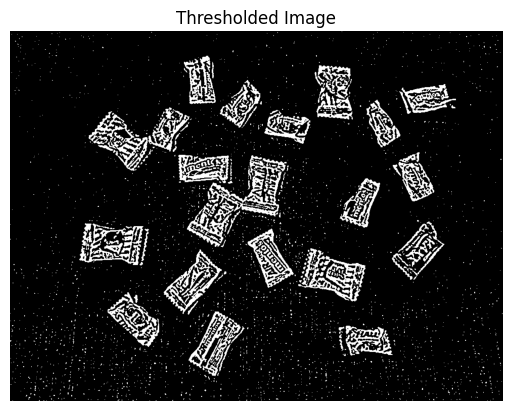

In [36]:
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

plt.imshow(thresh, cmap="gray")
plt.title("Thresholded Image")
plt.axis("off")

(np.float64(-0.5), np.float64(974.5), np.float64(731.5), np.float64(-0.5))

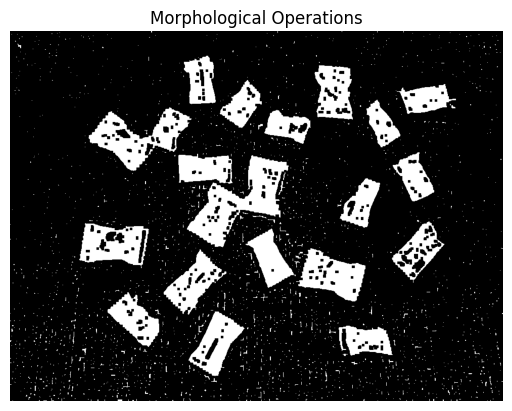

In [38]:
kernel = np.ones((3, 3), np.uint8)
morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

plt.imshow(morph, cmap="gray")
plt.title("Morphological Operations")
plt.axis("off")

(np.float64(-0.5), np.float64(974.5), np.float64(731.5), np.float64(-0.5))

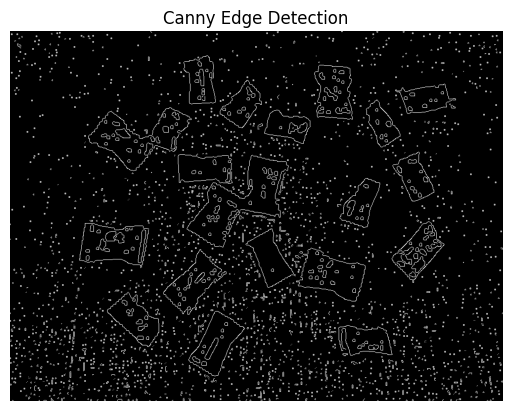

In [40]:
edges = cv2.Canny(morph, 50, 150)

plt.imshow(edges, cmap="gray")
plt.title("Canny Edge Detection")
plt.axis("off")

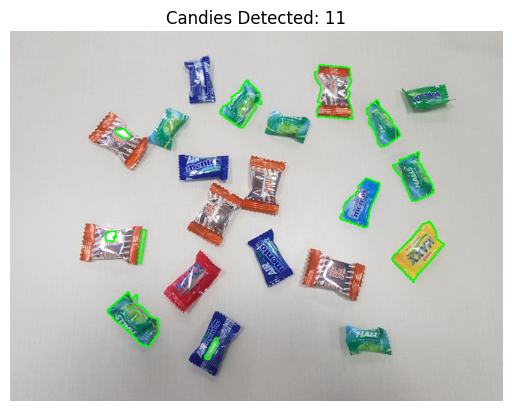

In [58]:
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
min_toffee_area = 300
max_toffee_area = 20000
toffee_contours = [cnt for cnt in contours if min_toffee_area < cv2.contourArea(cnt) < max_toffee_area]

toffee_count = len(toffee_contours)
toffee_img_copy = toffee_img.copy()
cv2.drawContours(toffee_img_copy, toffee_contours, -1, (0, 255, 0), 2)



plt.imshow(cv2.cvtColor(toffee_img_copy, cv2.COLOR_BGR2RGB))
plt.title(f"Candies Detected: {toffee_count}")
plt.axis("off")

plt.show()

Original Grayscale Image


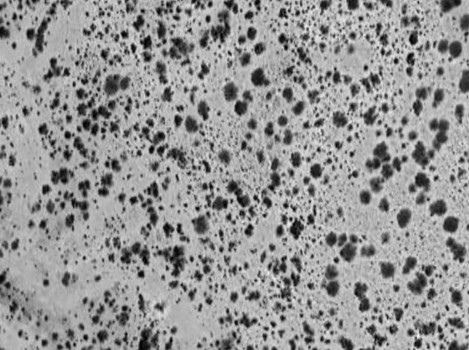

In [59]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image_path = "/content/sat2.jpg"

img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

print("Original Grayscale Image")
cv2_imshow(img)

Blurred Image


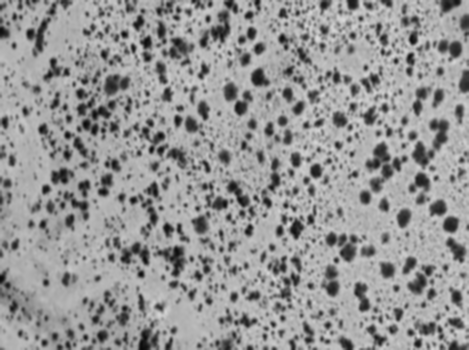

In [60]:
blurred = cv2.GaussianBlur(img, (5, 5), 0)
print("Blurred Image")
cv2_imshow(blurred)

Equalized Image


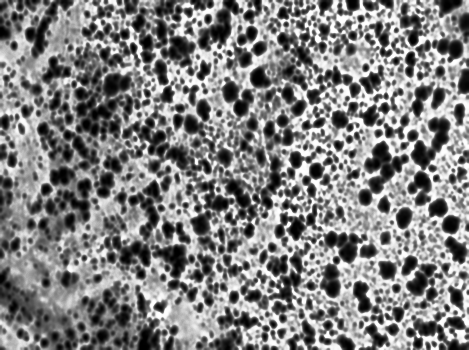

In [61]:
equalized = cv2.equalizeHist(blurred)
print("Equalized Image")
cv2_imshow(equalized)

Thresholded Image


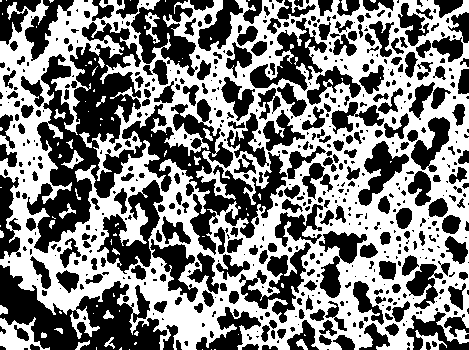

In [62]:
_, thresh = cv2.threshold(equalized, 127, 255, cv2.THRESH_BINARY)
print("Thresholded Image")
cv2_imshow(thresh)

Image with Blobs


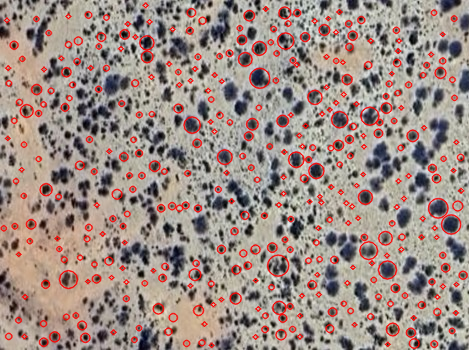

In [64]:
params = cv2.SimpleBlobDetector_Params()
params.filterByArea = True
params.minArea = 10
params.maxArea = 1000

params.filterByCircularity = True
params.minCircularity = 0.5

params.filterByConvexity = True
params.minConvexity = 0.8

params.filterByInertia = True
params.minInertiaRatio = 0.6

params.filterByColor = True
params.blobColor = 0

detector = cv2.SimpleBlobDetector_create(params)
keypoints = detector.detect(equalized)

img_color = cv2.imread(image_path)
img_with_blobs = cv2.drawKeypoints(img_color, keypoints, img_color.copy(), (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
print("Image with Blobs")
cv2_imshow(img_with_blobs)

Original Image (Color)


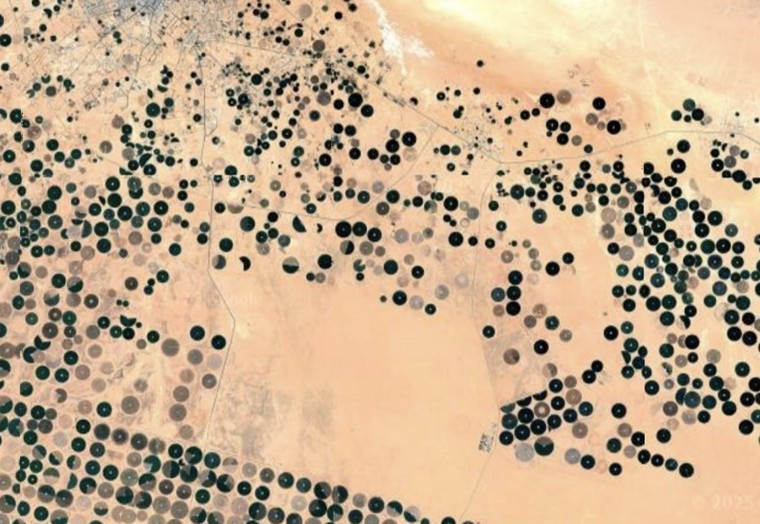

In [65]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image_path = "/content/sat1.jpg"

img = cv2.imread(image_path)
print("Original Image (Color)")
cv2_imshow(img)

Grayscale Image


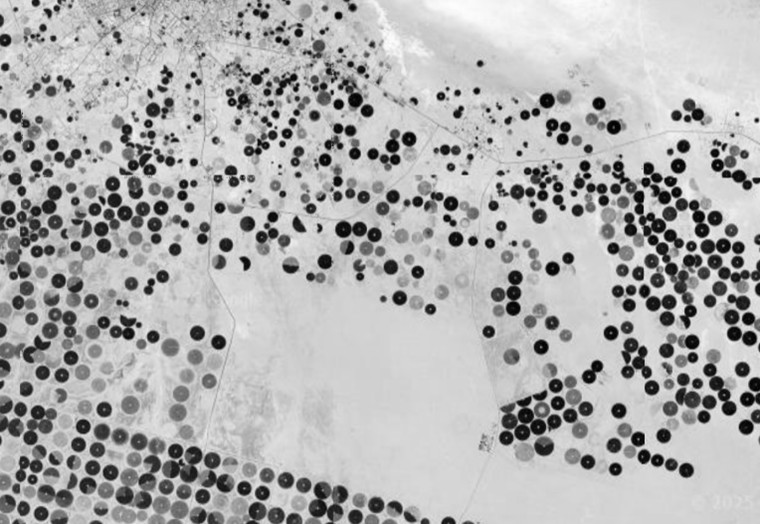

In [66]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print("Grayscale Image")
cv2_imshow(gray)

Blurred Image


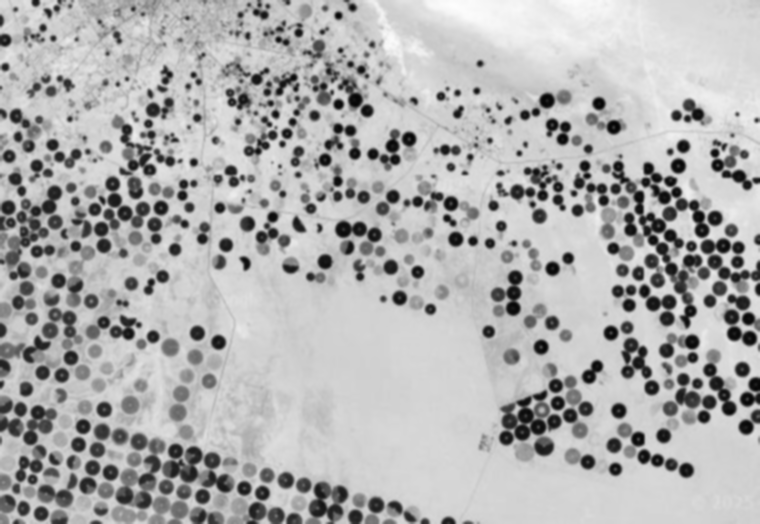

In [67]:
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
print("Blurred Image")
cv2_imshow(blurred)

Equalized Image


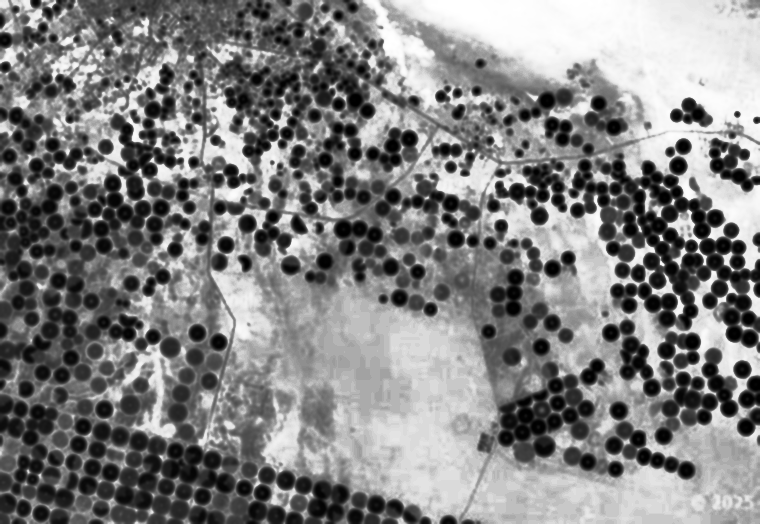

In [68]:
equalized = cv2.equalizeHist(blurred)
print("Equalized Image")
cv2_imshow(equalized)

Thresholded Image


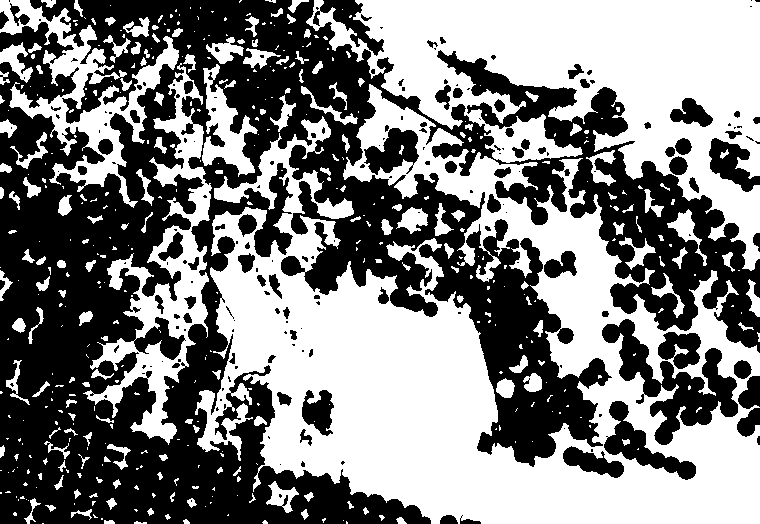

In [69]:
_, thresh = cv2.threshold(equalized, 127, 255, cv2.THRESH_BINARY)
print("Thresholded Image")
cv2_imshow(thresh)

Image with Blobs


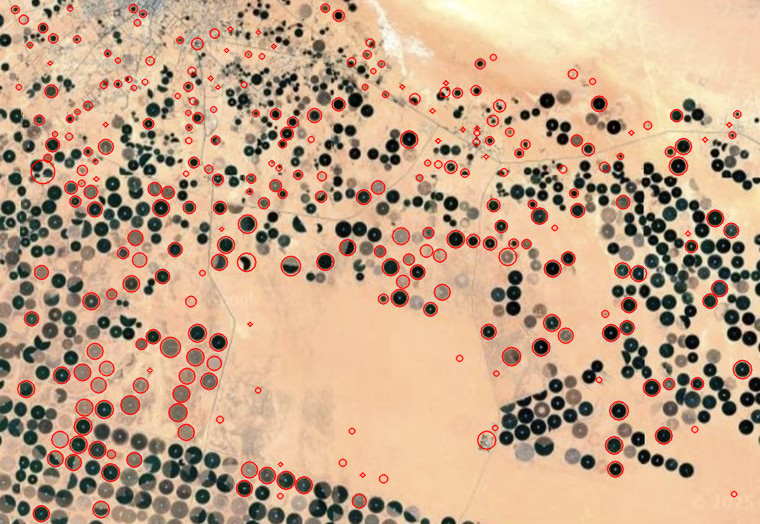

In [71]:
params = cv2.SimpleBlobDetector_Params()
params.filterByArea = True
params.minArea = 10
params.maxArea = 1000

params.filterByCircularity = True
params.minCircularity = 0.5

params.filterByConvexity = True
params.minConvexity = 0.8

params.filterByInertia = True
params.minInertiaRatio = 0.6

params.filterByColor = True
params.blobColor = 0

detector = cv2.SimpleBlobDetector_create(params)
keypoints = detector.detect(equalized)

img_with_blobs = cv2.drawKeypoints(img.copy(), keypoints, None, (0, 0, 255),cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
print("Image with Blobs")
cv2_imshow(img_with_blobs)

**Task:-2**

In [72]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import keras
import time
import matplotlib.image as mpimg
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1, l2
from tensorflow.keras import layers, models, applications, optimizers
from tensorflow.keras.datasets import cifar10, cifar100, mnist, fashion_mnist
from tensorflow.image import resize

from tensorflow.python.profiler.model_analyzer import profile
from tensorflow.python.profiler.option_builder import ProfileOptionBuilder

plt.style.use('dark_background')

In [73]:
(X_train, y_train), (X_test, y_test) = cifar100.load_data()
X_train, X_test = X_train.astype('float32') / 255.0, X_test.astype('float32') / 255.0
y_train, y_test = to_categorical(y_train, 100), to_categorical(y_test, 100)

169001437/169001437 ━━━━━━━━━━━━━━━━━━━━ 13s 0us/step


In [74]:
base_model = applications.VGG16(weights='imagenet', include_top=False, input_shape=(32, 32, 3))
for layer in base_model.layers[-4:]:
    layer.trainable = True

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [75]:
model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(10, activation='softmax')
])

In [76]:
model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(512, activation='relu', kernel_regularizer=keras.regularizers.l2(0.0005)),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(100, activation='softmax')
])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 1, 1, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 100)                 │          51,300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,030,692 (57.34 MB)

 Trainable params: 15,029,668 (57.33 MB)

 Non-trainable params: 1,024 (4.00 KB)

In [77]:
model.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

<Figure size 1000x1000 with 0 Axes>

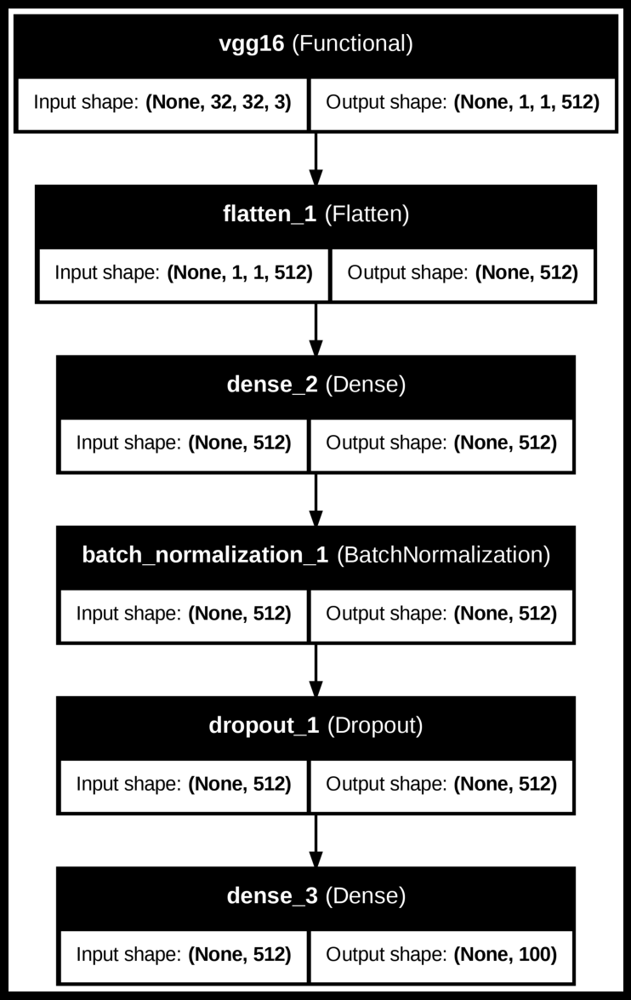

In [78]:
plt.figure(figsize=(10, 10))
plot_model(model, to_file='alexnet_custom_fc_model.png', show_shapes=True, show_layer_names=True, dpi=300)
img = mpimg.imread('alexnet_custom_fc_model.png')
plt.figure(figsize=(15, 15))
plt.imshow(img)
plt.axis('off')
plt.show()

In [79]:
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
datagen.fit(X_train)

In [80]:
start_time_pretrained = time.time()
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=20,
                    validation_data=(X_test, y_test))

pretrained_inference_time = time.time() - start_time_pretrained

Epoch 1/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 59s 61ms/step - accuracy: 0.0498 - loss: 4.6419 - val_accuracy: 0.1845 - val_loss: 3.5448
Epoch 2/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - accuracy: 0.2070 - loss: 3.4426 - val_accuracy: 0.3557 - val_loss: 2.6732
Epoch 3/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - accuracy: 0.2946 - loss: 2.9803 - val_accuracy: 0.3880 - val_loss: 2.5491
Epoch 4/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - accuracy: 0.3436 - loss: 2.7396 - val_accuracy: 0.4372 - val_loss: 2.2805
Epoch 5/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - accuracy: 0.3920 - loss: 2.5351 - val_accuracy: 0.4748 - val_loss: 2.1550
Epoch 6/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step - accuracy: 0.4195 - loss: 2.3977 - val_accuracy: 0.4766 - val_loss: 2.1621
Epoch 7/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - accuracy: 0.4489 - loss: 2.2700 - val_accuracy: 0.4744 - val_loss: 2.1840
Epoch 8/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - accuracy: 0.4668 - loss: 2.1901 - 

In [81]:
pretrained_accuracy = model.evaluate(X_test, y_test, verbose=1)[1] * 100

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6004 - loss: 1.6742


In [82]:
print(f"Model: VGG16 (Pretrained Features, Custom FC Layers) CIFAR100")
print(f"Accuracy: {pretrained_accuracy:.2f}%")
print(f"Inference Time: {pretrained_inference_time:.4f} seconds")

Model: VGG16 (Pretrained Features, Custom FC Layers) CIFAR100
Accuracy: 60.11%
Inference Time: 821.2099 seconds


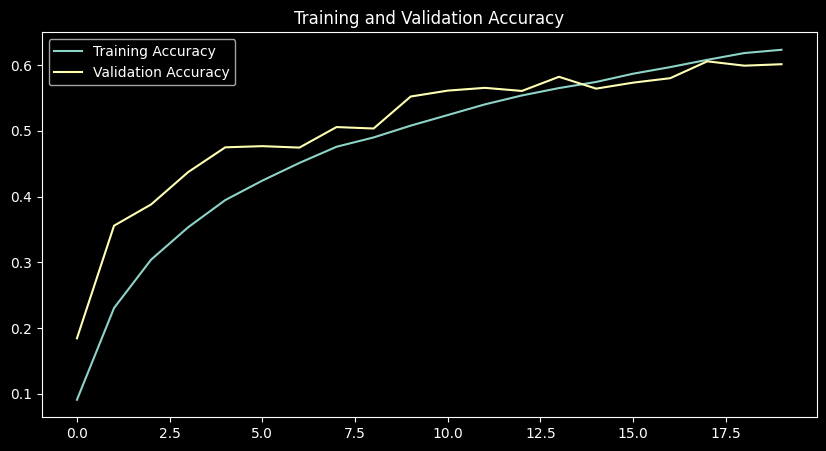

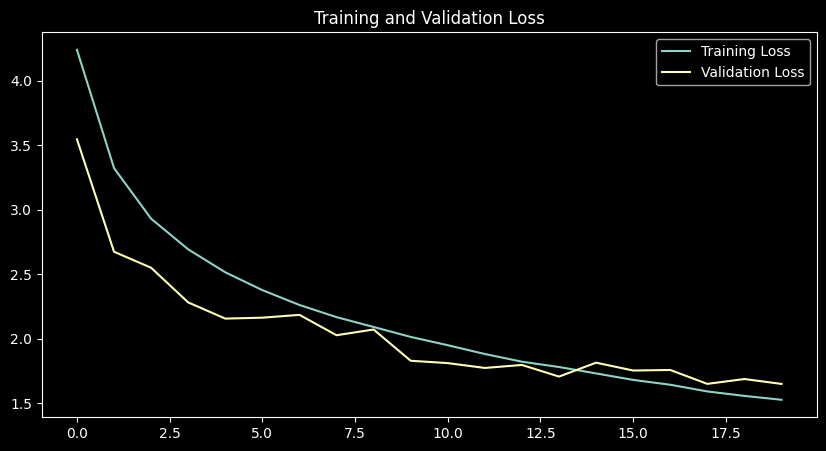

Model: VGG16 (Pretrained Features, Custom FC Layers) CIFAR100
Accuracy: 60.11%
Inference Time: 821.2099 seconds


In [83]:
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()


plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


print(f"Model: VGG16 (Pretrained Features, Custom FC Layers) CIFAR100")
print(f"Accuracy: {pretrained_accuracy:.2f}%")
print(f"Inference Time: {pretrained_inference_time:.4f} seconds")

In [84]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
from torch.utils.data import DataLoader
import sys


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [85]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.RandomHorizontalFlip(),
        transforms.RandomCrop(224, padding=4),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.247, 0.243, 0.261))
    ]),
    'test': transforms.Compose([
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.247, 0.243, 0.261))
    ])
}

train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=data_transforms['train'])
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=data_transforms['test'])

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)

100%|██████████| 170M/170M [00:13<00:00, 13.0MB/s]


In [86]:
model = models.alexnet(pretrained=True)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, 10)
model = model.to(device)

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 178MB/s]


In [87]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
train_loss_list = []
train_accuracy_list = []

In [88]:
import sys
import matplotlib.pyplot as plt

train_loss_list = []
train_accuracy_list = []
val_loss_list = []
val_accuracy_list = []

print("Starting Training...")
print("=" * 50)

for epoch in range(1, num_epochs + 1):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    print(f"\nEpoch [{epoch}/{num_epochs}]")
    print("-" * 50)

    for step, (inputs, labels) in enumerate(train_loader, 1):
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

        step_loss = loss.item()
        step_accuracy = 100. * correct / total

        sys.stdout.write(
            f"\rBatch [{step}/{len(train_loader)}], Loss: {step_loss:.4f}, Cumulative Accuracy: {step_accuracy:.2f}%"
        )
        sys.stdout.flush()

    train_loss = running_loss / len(train_loader)
    train_accuracy = 100. * correct / total
    train_loss_list.append(train_loss)
    train_accuracy_list.append(train_accuracy)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            val_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

    val_loss /= len(test_loader)
    val_accuracy = 100. * correct / total
    val_loss_list.append(val_loss)
    val_accuracy_list.append(val_accuracy)

    print(f"\nEpoch Summary [{epoch}/{num_epochs}], "
          f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")
    print("=" * 50)

print("Training Complete!")

Starting Training...

Epoch [1/10]
--------------------------------------------------
Batch [782/782], Loss: 1.4667, Cumulative Accuracy: 32.10%
Epoch Summary [1/10], Train Loss: 1.8081, Train Accuracy: 32.10%, Validation Loss: 1.5387, Validation Accuracy: 41.79%

Epoch [2/10]
--------------------------------------------------
Batch [782/782], Loss: 1.7383, Cumulative Accuracy: 46.01%
Epoch Summary [2/10], Train Loss: 1.4778, Train Accuracy: 46.01%, Validation Loss: 1.3404, Validation Accuracy: 50.31%

Epoch [3/10]
--------------------------------------------------
Batch [782/782], Loss: 1.7134, Cumulative Accuracy: 54.67%
Epoch Summary [3/10], Train Loss: 1.2606, Train Accuracy: 54.67%, Validation Loss: 1.2175, Validation Accuracy: 56.26%

Epoch [4/10]
--------------------------------------------------
Batch [782/782], Loss: 1.2180, Cumulative Accuracy: 59.53%
Epoch Summary [4/10], Train Loss: 1.1432, Train Accuracy: 59.53%, Validation Loss: 1.0191, Validation Accuracy: 64.87%

Epoch 

In [89]:
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

test_accuracy = 100. * correct / total
print(f"Test Accuracy: {test_accuracy:.2f}%")

Test Accuracy: 71.28%


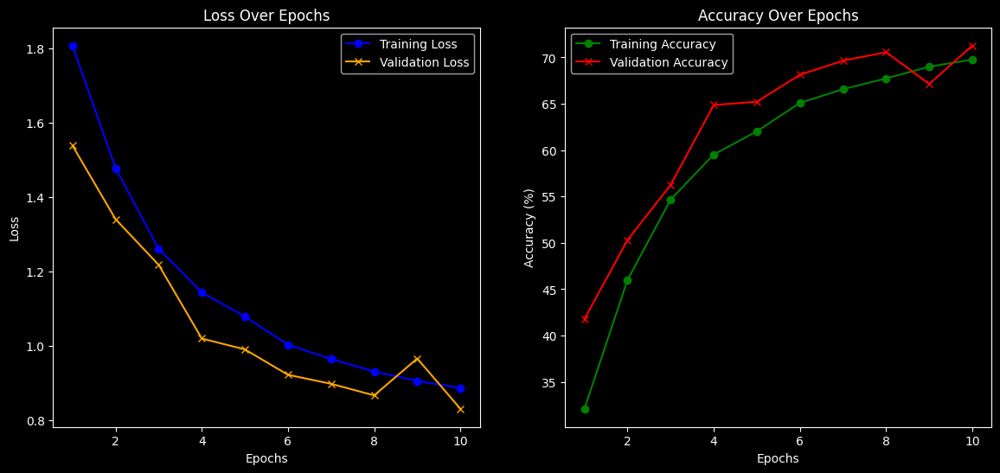

In [90]:
epochs_range = range(1, num_epochs + 1)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_loss_list, label='Training Loss', color='blue', marker='o')
plt.plot(epochs_range, val_loss_list, label='Validation Loss', color='orange', marker='x')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_accuracy_list, label='Training Accuracy', color='green', marker='o')
plt.plot(epochs_range, val_accuracy_list, label='Validation Accuracy', color='red', marker='x')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.legend()

plt.show()

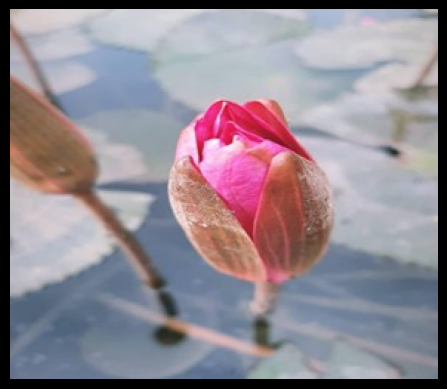

In [93]:
image_path = "/content/flow.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.axis('off')
plt.show()

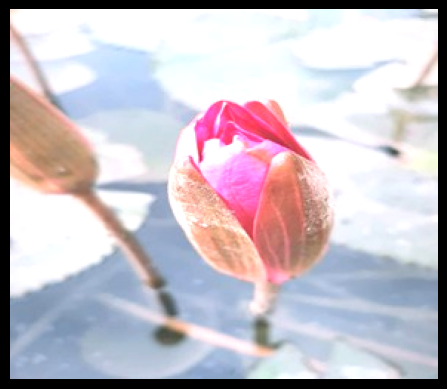

In [94]:
alpha = 1.2
beta = 30
image_bc = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
plt.imshow(image_bc)
plt.axis('off')
plt.show()

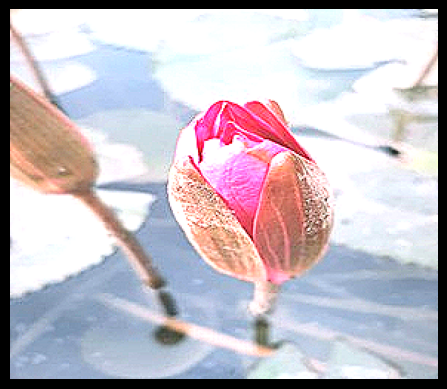

In [95]:
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
image_sharp = cv2.filter2D(image_bc, -1, kernel)
plt.imshow(image_sharp)
plt.axis('off')
plt.show()

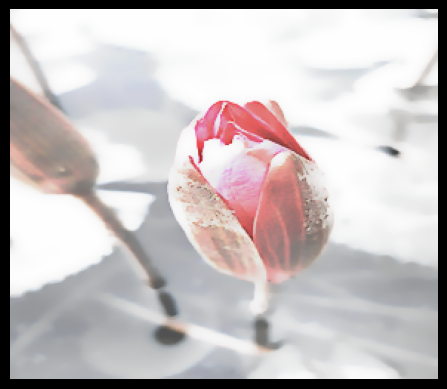

In [96]:
image_denoise = denoise_tv_chambolle(image_sharp, weight=0.1)
image_denoise = (image_denoise * 255).astype(np.uint8)
plt.imshow(image_denoise)
plt.axis('off')
plt.show()

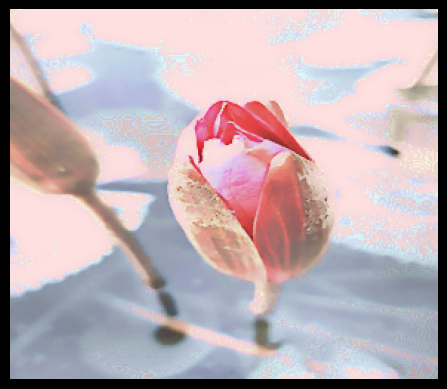

In [97]:
hsv = cv2.cvtColor(image_denoise, cv2.COLOR_RGB2HSV)
hsv[:, :, 1] = cv2.add(hsv[:, :, 1], 30)
image_color_enhanced = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
plt.imshow(image_color_enhanced)
plt.axis('off')
plt.show()

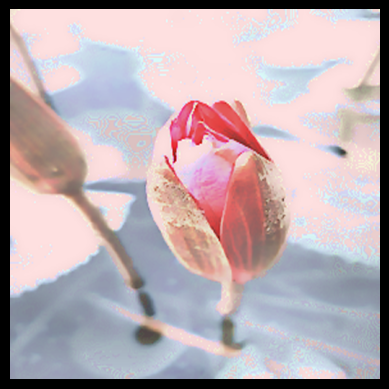

In [98]:
image_resized = cv2.resize(image_color_enhanced, (512, 512), interpolation=cv2.INTER_CUBIC)
plt.imshow(image_resized)
plt.axis('off')
plt.show()

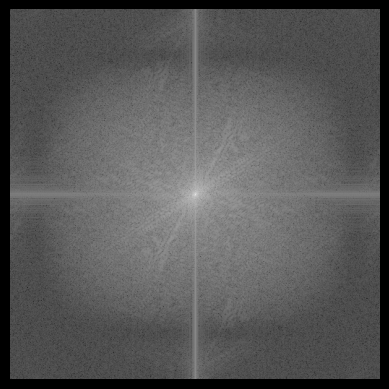

In [99]:
gray = cv2.cvtColor(image_resized, cv2.COLOR_RGB2GRAY)
f = np.fft.fft2(gray)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift))
plt.imshow(magnitude_spectrum, cmap='gray')
plt.axis('off')
plt.show()

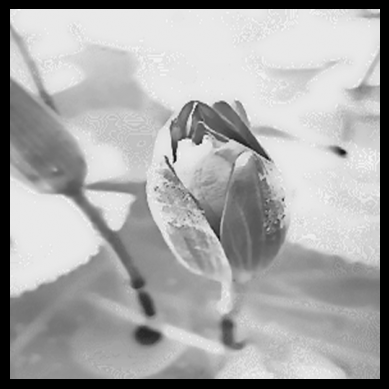

In [100]:
ishift = np.fft.ifftshift(fshift)
image_inverse = np.fft.ifft2(ishift)
image_inverse = np.abs(image_inverse)
image_inverse = cv2.normalize(image_inverse, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
plt.imshow(image_inverse, cmap='gray')
plt.axis('off')
plt.show()

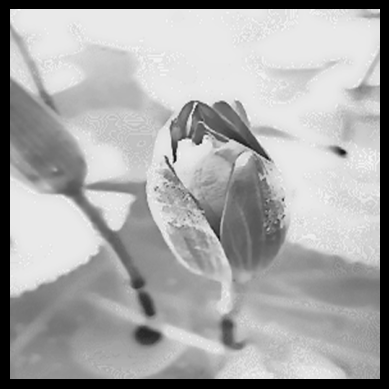

In [101]:
image_inverse_rgb = cv2.cvtColor(image_inverse, cv2.COLOR_GRAY2RGB)
plt.imshow(image_inverse_rgb)
plt.axis('off')
plt.show()

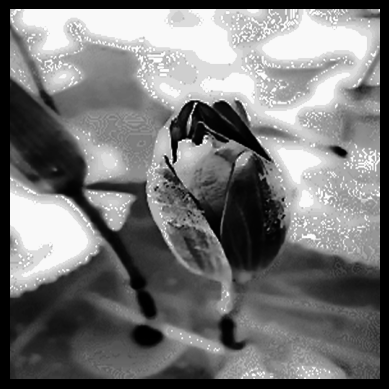

In [102]:
image_yuv = cv2.cvtColor(image_inverse_rgb, cv2.COLOR_RGB2YUV)
image_yuv[:, :, 0] = cv2.equalizeHist(image_yuv[:, :, 0])
image_hist_eq = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2RGB)
plt.imshow(image_hist_eq)
plt.axis('off')
plt.show()

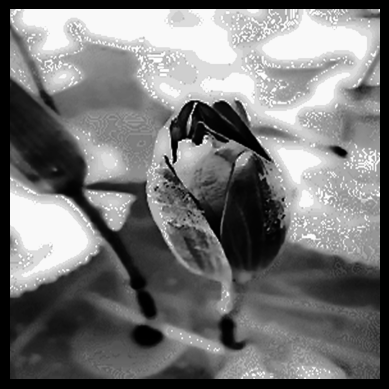

In [103]:
image_superres = cv2.resize(image_hist_eq, (1024, 1024), interpolation=cv2.INTER_CUBIC)
plt.imshow(image_superres)
plt.axis('off')
plt.show()

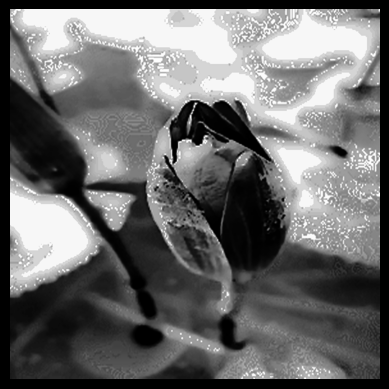

In [104]:
gamma = 1.2
image_corrected = np.power(image_superres / 255.0, gamma)
image_corrected = (image_corrected * 255).astype(np.uint8)
plt.imshow(image_corrected)
plt.axis('off')
plt.show()

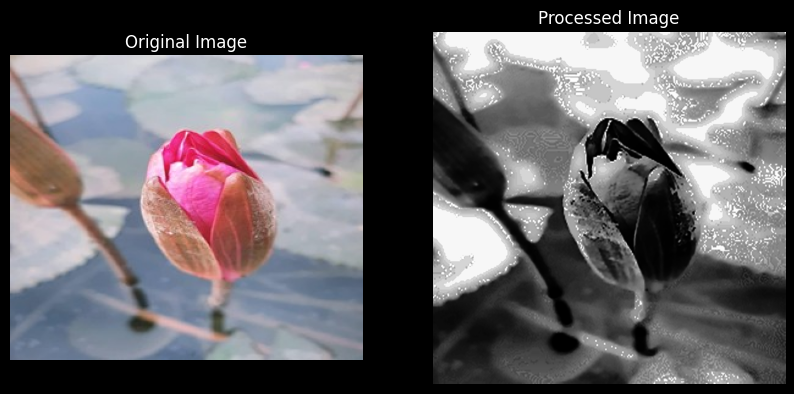

In [105]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(image_corrected)
axes[1].set_title("Processed Image")
axes[1].axis("off")

plt.show()

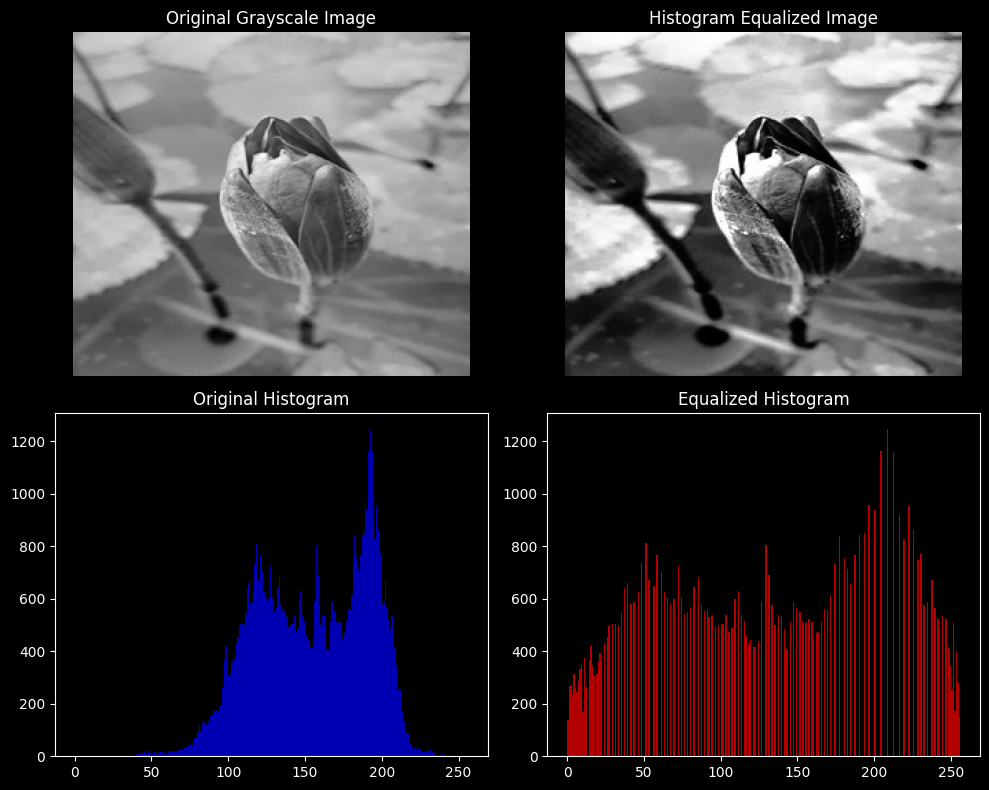

In [106]:
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

hist_eq = cv2.equalizeHist(gray)

fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0, 0].imshow(gray, cmap='gray')
axes[0, 0].set_title("Original Grayscale Image")
axes[0, 0].axis("off")

axes[0, 1].imshow(hist_eq, cmap='gray')
axes[0, 1].set_title("Histogram Equalized Image")
axes[0, 1].axis("off")

axes[1, 0].hist(gray.ravel(), bins=256, range=[0, 256], color='blue', alpha=0.7)
axes[1, 0].set_title("Original Histogram")

axes[1, 1].hist(hist_eq.ravel(), bins=256, range=[0, 256], color='red', alpha=0.7)
axes[1, 1].set_title("Equalized Histogram")

plt.tight_layout()
plt.show()